In [1]:
# Packages
import numpy as np
from IPython.display import display, HTML
from scipy.optimize import root_scalar
import plotly
import plotly.graph_objs as go
import plotly.io as pio
import plotly.offline as pyo
from plotly.subplots import make_subplots
plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

Define random variable $V$ by its PDF:
\begin{align*}
f_V(x) 
=
\frac{6}{\pi\sqrt{1-x^2}}\mathbb{1}\left\{ x\in \left(\frac{\sqrt{3}}{2},1 \right]\right\}.
\end{align*}
Then, with $U\sim U(0,1)$, we get by the inversion method
\begin{align*}
\sin\left( \frac{U\pi}{6} + \frac{\pi}{3} \right) \overset{d}{=} V.
\end{align*}

In [2]:
p = 5
q = 1
N = 10**5
v_vals = np.linspace(np.sqrt(3)/2,1,10**5)

def varphi_j(v,j):
    alpha_j = np.cos(2*np.pi*j/6)
    beta_j = np.sin(2*np.pi*j/6)
    
    return 64 * v**6 + 32 * alpha_j * v**5 - (96 + 32*beta_j*np.sqrt(1-v**2)) * v**4 - \
    40 * alpha_j * v**3 + (24*beta_j*np.sqrt(1-v**2)+36) * v**2 + 12*alpha_j*v + 1

def V_sample(N):
    U = np.random.rand(N)
    return np.sin(U*np.pi/6 + np.pi/3)

def Arcsin_pdf(x_vals,a,b):
    cond1 = x_vals <b
    cond2 = a < x_vals
    return 1/np.pi/np.sqrt((x_vals[cond1 & cond2] - a) * (b - x_vals[cond1 & cond2]))

In [15]:
j = 0

V_samples = V_sample(10*N)
varphi_j_vals = varphi_j(V_samples,j)

In [ ]:
#x_vals = np.linspace(1,9,N)
#pdf_vals = Arcsin_pdf(x_vals,0,9)
for j in range(3,4):
    
    V_samples = V_sample(10*N)
    varphi_j_vals = varphi_j(V_samples,j)
    
    fig = go.Figure()
    
    # Add histogram
    fig = go.Figure(data=[go.Histogram(x = varphi_j_vals, histnorm='probability density', nbinsx=1000, name='Norm. histo.')])
    
    #fig.add_trace(go.Scatter(x = x_vals, y = pdf_vals, mode='lines', name='Line Plot'))
    
    fig.update_layout(
        template = 'plotly',
        title = r'$\varphi_'+str(j)+r'(V)$',
        width = 1200,   # Adjust the width as needed
        height = 600,
        xaxis_title = r'$x$',
        yaxis_title = r'Probability',
        xaxis = dict(
            range = [np.min(varphi_j_vals)-0.1, np.max(varphi_j_vals)+0.1]
        ),
        yaxis = dict(
            range = [0,10]
        )
    )
    fig.show()

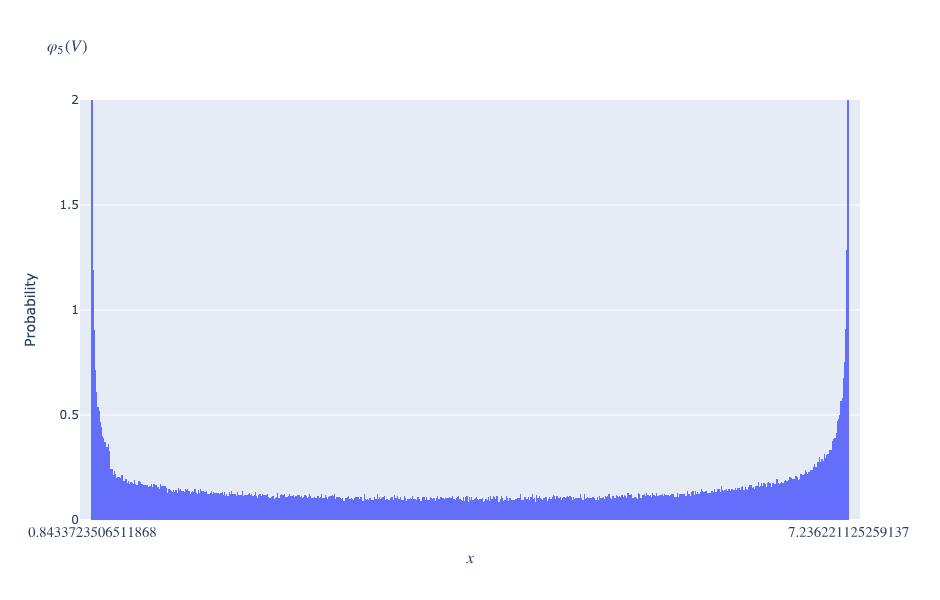

In [3]:
j = 1

V_samples = V_sample(N)
varphi_j_vals_1 = varphi_j(V_samples,j)

j = 5

V_samples = V_sample(N)
varphi_j_vals_5 = varphi_j(V_samples,j)

varphi_j_vals = np.append(varphi_j_vals_1,varphi_j_vals_5)

fig = go.Figure()

# Add histogram
fig = go.Figure(data=[go.Histogram(x = varphi_j_vals, histnorm='probability density', nbinsx=1000, name='Norm. histo.')])

a = np.min(varphi_j_vals)
b = np.max(varphi_j_vals)

#x_vals = np.linspace(a,b,N)
#pdf_vals = Arcsin_pdf(x_vals,a,b)

#fig.add_trace(go.Scatter(x = x_vals, y = pdf_vals, mode='lines', name='Line Plot'))

tickvals = [a, b]
ticktext = [ r'$'+str(a)+'$',
    r'$'+str(b)+'$'
]

fig.update_layout(
    template = 'plotly',
    title = r'$\varphi_'+str(j)+r'(V)$',
    width = 1200,   # Adjust the width as needed
    height = 600,
    xaxis_title = r'$x$',
    yaxis_title = r'Probability',
    xaxis = dict(
        range = [a - 0.1, b + 0.1],
        tickvals=tickvals,
        ticktext=ticktext,
        tickmode='array'
    ),
    yaxis = dict(
        range = [0,2]
    )
)
fig.show()